# Introduction

Hello, my name is Nguyen. I am working at TotalEnergies as a Deep Learning Researcher and Computer Vision Engineer for my end-of-studies internship (6 months) on the project " Satellite Imagery & AI: Prediction of solar photovoltaic potential from open data". If you are curious about my work at TotalEnergies, please take a look at: https://github.com/dnduong/SunPower

In [1]:
import tensorflow as tf
import os
import random
import itertools

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Input, Concatenate, Lambda, Dot, Activation
import numpy as np
import matplotlib.pyplot as plt

from skimage.io import imread
from skimage.transform import resize

from tensorflow.keras.applications.resnet import ResNet152
from tensorflow.keras.applications.imagenet_utils import preprocess_input
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import load_model

In [2]:
# If you have a GPU, execute the following lines to restrict the amount of VRAM used:
gpus = tf.config.experimental.list_physical_devices('GPU')
if len(gpus) >= 1:
    print("Using GPU {}".format(gpus[0]))
else:
    print("Using CPU")

Using GPU PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


# PATH

In [3]:
PATH = "train_data/"
dirs = sorted(os.listdir(PATH))
name_to_classid = {d: i for i, d in enumerate(dirs)}
classid_to_name = {v: k for k, v in name_to_classid.items()}
num_classes = len(name_to_classid)

print("number of classes: ", num_classes)

number of classes:  2


In [4]:
# read all directories
img_paths = {c: [PATH + subfolder + "/" + img
                 for img in sorted(os.listdir(PATH + subfolder))] 
             for subfolder, c in name_to_classid.items()}

# retrieve all images
all_images_path = []
for img_list in img_paths.values():
    all_images_path += img_list

# map to integers
path_to_id = {v: k for k, v in enumerate(all_images_path)}
id_to_path = {v: k for k, v in path_to_id.items()}

In [5]:
classid_to_ids = {k: [path_to_id[path] for path in v] for k, v in img_paths.items()}
id_to_classid = {v: c for c, imgs in classid_to_ids.items() for v in imgs}

# DATA

After investigating the data, I see that I have a huge problem: there are too little data. I only have 100 images for both classes: fields and roads (50 each). By creating a classic binary classification model, we might have high accuracy in the training phase but it might not work for real-world data because lack of data often leads to overfitting. For surpass the problem, after a few researches, I decided to do a meta learning model.

Ideas :
- Using data augmentation
- Using a few shot learning model (Siasmese network with transfer learning, constrative loss)

Since a Siamese network takes 2 images as input, we need to prepare the data to feed our model as below :
![image](images/data_prep.JPG)

A positive pair : 2 images of the same class

A negative pair : 2 images of different classes

In [6]:
def build_pos_pairs_for_id(classid, max_num = 900):
    """
    build pairs of positive image ids for a given classid
    """
    imgs = classid_to_ids[classid]
    
    if len(imgs) == 1:
        return []

    pos_pairs = list(itertools.combinations(imgs, 2))
    
    random.shuffle(pos_pairs)
    return pos_pairs[:max_num]

In [7]:
def build_neg_pairs_for_id(classid, max_num = 900):
    """
    build pairs of negative image ids for a given classid
    """
    if classid == 1 : neg_classid = 0
    else : neg_classid = 1
    imgs = classid_to_ids[classid]
    imgs2 = classid_to_ids[neg_classid]    
    neg_pairs = []
    for id1 in range(len(imgs)):
        for id2 in range(id1,len(imgs2)):
            img1 = imgs[id1]     
            img2 = imgs2[id2]
            neg_pairs += [(img1, img2)]
    random.shuffle(neg_pairs)
    return neg_pairs[:max_num]

In [8]:
def resize224(img):
    """
    resize image (squared image for input)
    """
    return resize(img, (224, 224), preserve_range=True, mode='reflect', anti_aliasing=True)


def open_all_images(id_to_path):
    """
    open images
    Params : path
    Returns : np array contains all images
    """
    all_imgs = []
    for path in id_to_path.values():
        all_imgs += [np.expand_dims(resize224(imread(path)), 0)]
    return np.vstack(all_imgs)

In [9]:
all_imgs = open_all_images(id_to_path)
all_imgs.shape

(90, 224, 224, 3)

In [10]:
def build_train_test_data(split):
    """
    build train and valid data based on split factor
    Params : split factor
    Returns : train and valid dataset
    """
    X1_ids_train = []
    X2_ids_train = []
    Y_ids_train = []
    
    X1_ids_valid = []
    X2_ids_valid = []
    Y_ids_valid = []
    
    for class_id in range(num_classes):
        
        pos = build_pos_pairs_for_id(class_id)
        neg = build_neg_pairs_for_id(class_id)
        
        split_index = (int)(len(pos)*0.8)
        
        #TRAIN
        
        for pair in pos[:split_index]:
            X1_ids_train += [pair[0]]
            X2_ids_train += [pair[1]]
            Y_ids_train += [1]
    
        for pair in neg[:split_index]:
            X1_ids_train += [pair[0]]
            X2_ids_train += [pair[1]]
            Y_ids_train += [0]
           
        #TEST
        
        for pair in pos[split_index:]:
            X1_ids_valid += [pair[0]]
            X2_ids_valid += [pair[1]]
            Y_ids_valid += [1]
        
        for pair in neg[split_index:]:
            X1_ids_valid += [pair[0]]
            X2_ids_valid += [pair[1]]
            Y_ids_valid += [0]
            
    perm = np.random.permutation(len(X1_ids_train))
    X1_ids_train = np.array(X1_ids_train)[perm]
    X2_ids_train = np.array(X2_ids_train)[perm]
    Y_ids_train = np.array(Y_ids_train)[perm]
    
    perm = np.random.permutation(len(X1_ids_valid))
    X1_ids_valid = np.array(X1_ids_valid)[perm]
    X2_ids_valid = np.array(X2_ids_valid)[perm]
    Y_ids_valid = np.array(Y_ids_valid)[perm]
    
    return (X1_ids_train, X2_ids_train, Y_ids_train,
            X1_ids_valid, X2_ids_valid, Y_ids_valid)

In [11]:
X1_ids_train, X2_ids_train, train_Y, X1_ids_valid, X2_ids_valid, valid_Y = build_train_test_data(0.8)

In [12]:
X1_ids_train.shape, X2_ids_train.shape, train_Y.shape

((2880,), (2880,), (2880,))

In [13]:
np.mean(train_Y)

0.5

In [14]:
X1_ids_valid.shape, X2_ids_valid.shape, valid_Y.shape

((720,), (720,), (720,))

In [15]:
np.mean(valid_Y)

0.5

In [16]:
valid_X1 = all_imgs[X1_ids_valid]
valid_X2 = all_imgs[X2_ids_valid]

# AUGMENTATION

To surpass the lack of data, I apply some augmentation for the training dataset :

- vertically flip 50% of all images
- crop some of the images by 0-10% of their height/width
- small gaussian blur with random sigma between 0 and 0.5 but we only blur about 50% of all images
- Apply affine transformations to each image : Scale/zoom them, translate/move them, rotate them and shear them..


In [33]:
from imgaug import augmenters as iaa
import imgaug as ia

seq = iaa.Sequential([
    iaa.Flipud(0.5),
    iaa.Crop(percent=(0, 0.1)),
    iaa.Sometimes(
        0.5,
        iaa.GaussianBlur(sigma=(0, 0.5))
    ),
    iaa.Affine(
        scale={"x": (0.8, 1.2), "y": (0.8, 1.2)},
        translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)},
        rotate=(-10, 10),
        shear=(-4, 4)

    )
], random_order=True)

# GENERATOR

In [34]:
class Generator(tf.keras.utils.Sequence):

    def __init__(self, X1, X2, Y, batch_size, all_imgs):
        self.batch_size = batch_size
        self.X1 = X1
        self.X2 = X2
        self.Y = Y
        self.imgs = all_imgs
        self.num_samples = Y.shape[0]
        
    def __len__(self):
        return self.num_samples // self.batch_size
        
    def __getitem__(self, batch_index):
        """This method returns the `batch_index`-th batch of the dataset.
        
        Keras choose by itself the order in which batches are created, and several may be created
        in the same time using multiprocessing. Therefore, avoid any side-effect in this method!
        """
        low_index = batch_index * self.batch_size
        high_index = (batch_index + 1) * self.batch_size
        
        imgs1 = seq.augment_images(self.imgs[self.X1[low_index:high_index]])
        imgs2 = seq.augment_images(self.imgs[self.X2[low_index:high_index]])
        targets = self.Y[low_index:high_index]
    
        return ([imgs1, imgs2], targets)

In [35]:
train_gen = Generator(X1_ids_train, X2_ids_train, train_Y, 4, all_imgs)

In [36]:
[x1, x2], y = train_gen[0]

x1.shape, x2.shape, y.shape

((4, 224, 224, 3), (4, 224, 224, 3), (4,))

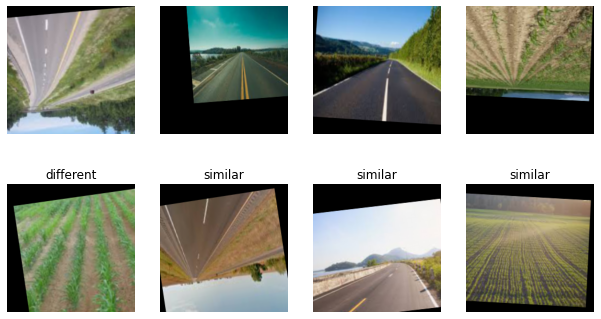

In [37]:
plt.figure(figsize=(16, 6))

for i in range(4):
    plt.subplot(2, 6, i + 1)
    plt.imshow(x1[i] / 255)
    plt.axis('off')
    
for i in range(4):
    plt.subplot(2, 6, i + 7)
    plt.imshow(x2[i] / 255)
    if y[i]==1.0:
        plt.title("similar")
    else:
        plt.title("different")
    plt.axis('off')
    
plt.show()

# LOSS and METRIC

To train the model, a contrastive loss was used : Pushes together same class pairs, and further away different class ones, up to a margin.

$L_{contrastive}(Y,D) = \frac{1}{2}(1-Y)D^2 + \frac{1}{2}Y max(0,m-D)^2$

In [38]:
@tf.function
def contrastive_loss(y_true, y_pred, margin=0.25):
    '''Contrastive loss from Hadsell-et-al.'06
    http://yann.lecun.com/exdb/publis/pdf/hadsell-chopra-lecun-06.pdf
    '''
    y_true = tf.cast(y_true, "float32")
    return tf.reduce_mean( y_true * tf.square(1 - y_pred) +
                  (1 - y_true) * tf.square(tf.maximum(y_pred - margin, 0)))

@tf.function
def accuracy_sim(y_true, y_pred, threshold=0.5):
    '''Compute classification accuracy with a fixed threshold on similarity.
    '''
    y_thresholded = tf.cast(y_pred > threshold, "float32")
    return tf.reduce_mean(tf.cast(tf.equal(y_true, y_thresholded), "float32"))

# MODEL

Siamese network architecture

![image](images/siamese.png)


Note: 2 CNN are the same CNN with the same weight
We use a CNN as a features extractor. By applying this CNN to the input, we have 2 vectors corresponding to 2 images. Newt, we calculate cosine similarity between those features vectors and then compute contrastive loss for backpropagation.

Since we have a little data. I will use a Resnet152 pretrained with Imagenet as our CNN features extractor.

In [39]:
def SharedConv():
    """
    build shared CNN features extractor : Resnet152 pretrained with Imagenet
    """
    model = ResNet152(include_top=True, weights='imagenet')
    inputs = model.layers[0].input
    outputs = model.layers[-2].output
    shared_conv = Model(inputs, outputs)
    return shared_conv

shared_conv = SharedConv()

In [ ]:
"""class Siamese(tf.keras.Model):
    def __init__(self, shared_conv):
        super().__init__(self, name="siamese")
        self.conv = shared_conv
        self.dot = Dot(axes=-1, normalize=True)
        
    def call(self, inputs):
        i1, i2 = inputs
        i1, i2 = preprocess_input(i1), preprocess_input(i2)
        x1 = self.conv(i1)
        x2 = self.conv(i2)
        sim = self.dot([x1, x2])
        return sim


model = Siamese(shared_conv)"""

In [46]:
def Siamese(shared_conv):
    input1 = Input(shape = (224,224,3))
    input2 = Input(shape = (224,224,3))
    
    x1 = shared_conv(input1)
    x2 = shared_conv(input2)
    sim = Dot(axes=-1, normalize=True)([x1,x2])
    return Model([input1,input2],sim)

In [47]:
model = Siamese(shared_conv)

In [48]:
model.summary()

Model: "functional_9"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
input_8 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
functional_5 (Functional)       (None, 2048)         58370944    input_7[0][0]                    
                                                                 input_8[0][0]                    
__________________________________________________________________________________________________
dot_2 (Dot)                     (None, 1)            0           functional_5[2][0]    

# TRAIN

In [49]:
epochs = 10
lr_init = 0.0001
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_init)
model.compile(loss=contrastive_loss, optimizer=optimizer, metrics=[accuracy_sim])
best_model_fname = "siamese_checkpoint.h5"
best_model_cb = ModelCheckpoint(best_model_fname, monitor='val_loss',
                                save_best_only=True, verbose=1)
model.fit(train_gen, 
        epochs=epochs,
        validation_data=([valid_X1, valid_X2], valid_Y),
        callbacks=[best_model_cb])

Epoch 1/10
720/720 [==============================] - ETA: 0s - loss: 0.0376 - accuracy_sim: 0.9208
Epoch 00001: val_loss improved from inf to 0.18329, saving model to siamese_checkpoint.h5
720/720 [==============================] - 238s 330ms/step - loss: 0.0376 - accuracy_sim: 0.9208 - val_loss: 0.1833 - val_accuracy_sim: 0.5693
Epoch 2/10
720/720 [==============================] - ETA: 0s - loss: 0.0079 - accuracy_sim: 0.9840
Epoch 00002: val_loss improved from 0.18329 to 0.00188, saving model to siamese_checkpoint.h5
720/720 [==============================] - 232s 323ms/step - loss: 0.0079 - accuracy_sim: 0.9840 - val_loss: 0.0019 - val_accuracy_sim: 0.9986
Epoch 3/10
720/720 [==============================] - ETA: 0s - loss: 0.0047 - accuracy_sim: 0.9865
Epoch 00003: val_loss improved from 0.00188 to 0.00038, saving model to siamese_checkpoint.h5
720/720 [==============================] - 233s 324ms/step - loss: 0.0047 - accuracy_sim: 0.9865 - val_loss: 3.8169e-04 - val_accuracy_s

# EVALUATE

For predictions, we need to use a support set that contains 1 example image of each class (one-shot learning). Then, we compute the similarity between the object that we want to predict and each image of the support set. The class which has the highest similarity with the object is the predicted class.

![image](images/prediction.JPG)


In [50]:
model.load_weights(best_model_fname)

In [51]:
#take a random support set
support_set = np.array([all_imgs[random.choice(classid_to_ids[0])].copy(),all_imgs[random.choice(classid_to_ids[1])].copy()])
query = all_imgs.copy()

In [52]:
labels = list(id_to_classid.values())

In [53]:
def get_sim(s,q):
    """
    get similarity scores between query and support
    """
    sim = []
    for i in range(q.shape[0]):
        sim1 = model.predict((support_set[0][np.newaxis],q[i][np.newaxis]))
        sim2 = model.predict((support_set[1][np.newaxis],q[i][np.newaxis]))
        sim.append((sim1,sim2))
    return sim

In [54]:
sim = get_sim(support_set,query)
predictions = [np.argmax(s) for s in sim]

In [55]:
from sklearn.metrics import accuracy_score
accuracy_score(labels,predictions)

1.0

In [56]:
def plot_train():
    plt.figure(figsize=(25, 90))
    for i in range(90):
        ax = plt.subplot(18, 5, i + 1)
        pred = predictions[i]
        plt.imshow(all_imgs[i]/255)
        if classid_to_name[labels[i]] == classid_to_name[pred] : 
            color = "green"
        else:
            color = "red"
        plt.title(f'true : {classid_to_name[labels[i]]} / pred: {classid_to_name[pred]} ',color = color)
        plt.axis("off")

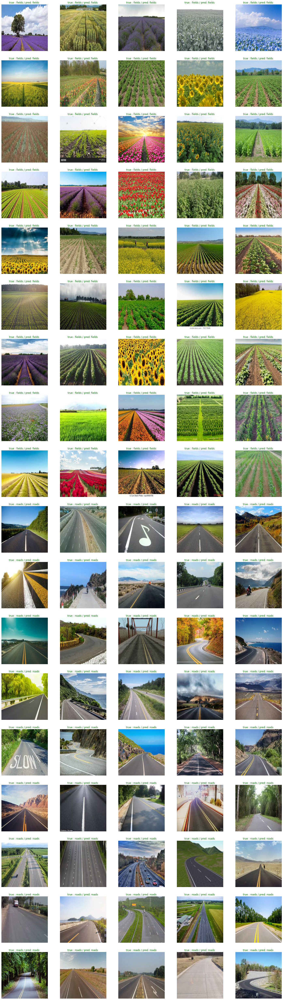

In [57]:
plot_train()

As we can see, we reach 100% accuracy on the training and valid dataset. 

# TEST

For further evaluation, I manually downloaded some images of fields and roads to check the performance of the model. Those images are never seen by the model. Let's check it.

In [58]:
paths = [os.path.join('./test_data',f) for f in os.listdir('./test_data') if f.endswith('.jpg')]
test_imgs = []
for path in paths:
    test_imgs += [np.expand_dims(resize224(imread(path)), 0)]
test_imgs = np.vstack(test_imgs)

In [59]:
sim = get_sim(support_set,test_imgs)
predictions = [np.argmax(s) for s in sim]

In [60]:
def plot_test():
    plt.figure(figsize=(25, 10))
    for i in range(len(predictions)):
        ax = plt.subplot(2, 5, i + 1)
        pred = predictions[i]
        plt.imshow(test_imgs[i]/255)
        plt.title(f'pred: {classid_to_name[pred]}')
        plt.axis("off")

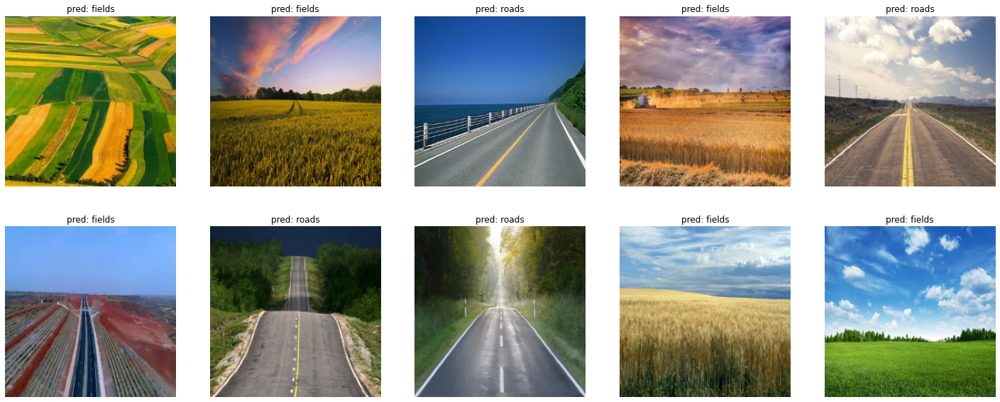

In [61]:
plot_test()

Conclusion: An interesting exercise, that helped me to discover and learn meta-learning and siamese network.

# Paper review